# PCA part
after: https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60

In [ ]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data"# load dataset into Pandas DataFrame
df = pd.read_csv(url, names=['sepal length','sepal width','petal length','petal width','target'])
features = ['sepal length', 'sepal width', 'petal length', 'petal width']
# Separating out the features
x = df.loc[:, features].values
# Separating out the target
y = df.loc[:,['target']].values
# Standardizing the features
x = StandardScaler().fit_transform(x)
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
finalDf = pd.concat([principalDf, df[['target']]], axis = 1)
finalDf
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = ['Iris-setosa', 'Iris-versicolor', 'Iris-virginica']
colors = ['r', 'g', 'b']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['target'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()
#Variation explained
print(pca.explained_variance_ratio_)
np.sum(pca.explained_variance_ratio_)

## On the Centerline Dataset

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import os

In [2]:
from annotate_behaviour import *

In [18]:
path='/Users/ulises.rey/local_data/PCA_analysis/res.csv'

df=pd.read_csv(path, header=None)
inital_segment, end_segment, n_components = 30, 80, 5

df.fillna(0, inplace=True)


pca, principalDf=make_pca(df, inital_segment, end_segment, n_components)


data shape:  (300217, 50)
(300217, 5)


In [19]:
print(principalDf.shape)

(300217, 5)


<>:5: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:5: SyntaxWarning: "is" with a literal. Did you mean "=="?
/var/folders/05/51cjpn_n1nl2ngymqcknpsww001sbb/T/ipykernel_29474/2255540283.py:5: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if pc is 'PC3': break


Text(0, 0.5, '')

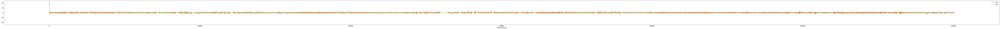

In [23]:
time=np.arange(0,principalDf.shape[0])#np.arange(195003)#(142465)#(20000,30000)#np.arange(18000,42000)#np.arange(57500,62000)#np.arange(18000,42000)
#plt.figure(figsize=(10,1000), dpi=50)
plt.rcParams.update({'font.size': 15})
for pc in principalDf:
    if pc is 'PC3': break
    ax=principalDf.loc[time,pc].plot(legend=True, figsize=(200,5), linewidth=2)
ax.set_xlabel('Time (frames)', fontsize = 15)
ax.set_ylim([-25,25])
#ax.set_xlim([0,80000])
ax.set_ylabel('',fontsize = 15)

In [21]:
principalDf.head(10)
#pc1Xpc2=pd.DataFrame(np.cross(principalDf['PC1'],principalDf['PC2']), index=principalDf.index)

,PC1,PC2,PC3,PC4,PC5
0,3785.168450,12.192423,10.145877,1.736816,-1.529891
1,0.308908,-1.125263,-0.687699,0.445045,0.047713
2,0.192170,-0.678804,-1.000275,0.579808,-0.090634
3,0.225339,-0.844416,-0.882102,0.625144,-0.011182
4,0.216406,-0.775582,-0.956793,0.524069,-0.043306
5,0.246972,-0.922115,-0.824848,0.554171,-0.070059
6,0.238295,-0.842432,-0.917342,0.558780,-0.045403
7,0.258616,-0.888244,-0.884092,0.550122,0.011110
8,0.279994,-1.013623,-0.748492,0.558777,0.013870
9,0.252680,-0.926902,-0.860140,0.500651,-0.019680


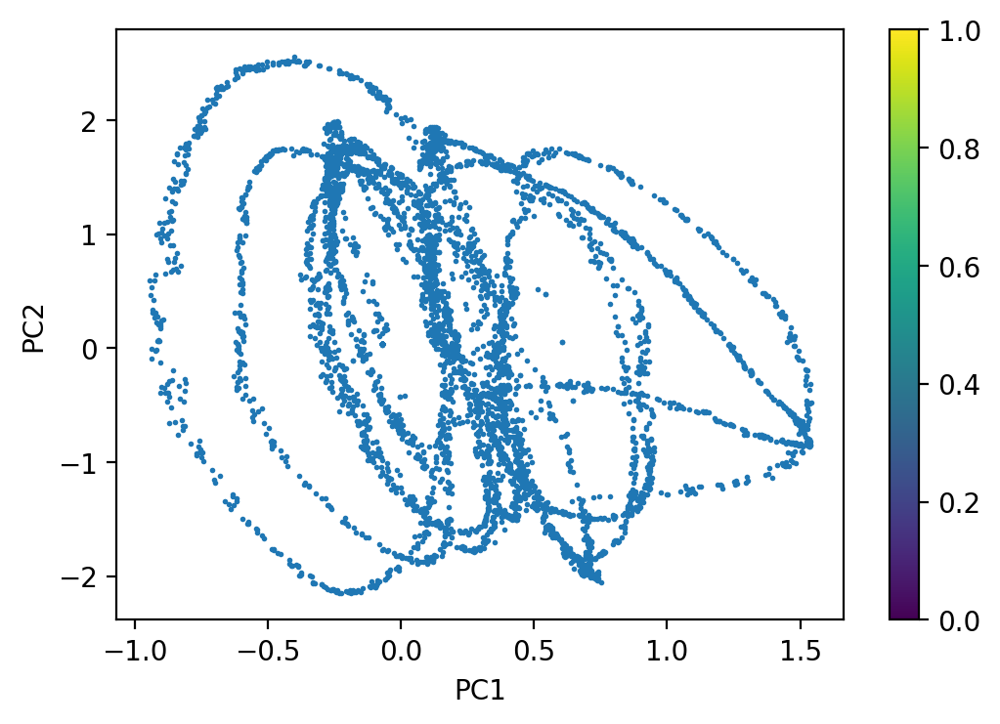

In [24]:
plt.rcParams.update({'font.size': 10})

time=np.arange(19419,25499)#np.arange(10000,14000)
#if you want to see one particular timepoint
pos=149

avg_win=2
x=principalDf.loc[time,'PC1'].rolling(window=avg_win).mean()
y=principalDf.loc[time,'PC2'].rolling(window=avg_win).mean()
plt.figure(dpi=200)
plt.scatter(x,y, s=1)
#plt.scatter(x.iloc[pos], y.iloc[pos],marker='o')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.colorbar()
plt.show()

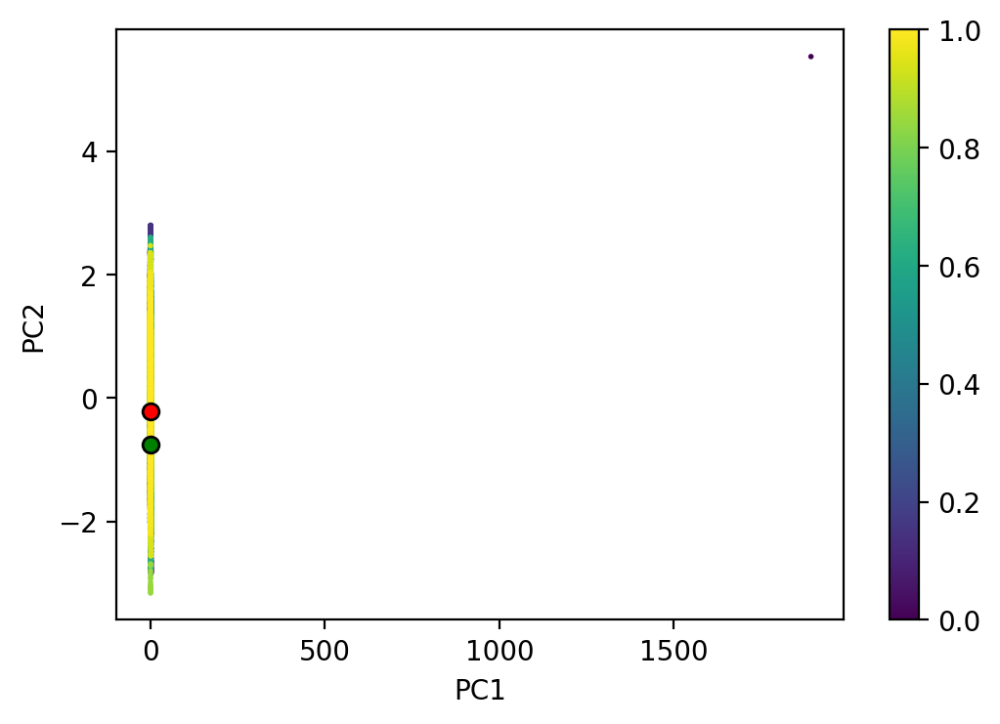

In [25]:
plt.rcParams.update({'font.size': 10})

x=principalDf.loc[:,'PC1'].rolling(window=avg_win).mean()
y=principalDf.loc[:,'PC2'].rolling(window=avg_win).mean()
plt.figure(dpi=200)
plt.scatter(x,y, c=np.arange(len(x)), s=1, cmap='viridis')
plt.scatter(x.to_numpy()[avg_win+1],y.to_numpy()[avg_win+1], c='g', edgecolors='k')
plt.scatter(x.to_numpy()[-1],y.to_numpy()[-1], c='r', edgecolors='k')
plt.xlabel('PC1')
plt.ylabel('PC2')
#lim=0.05#0.25
# plt.xlim([-lim, lim])
# plt.ylim([-lim, lim])
plt.colorbar()


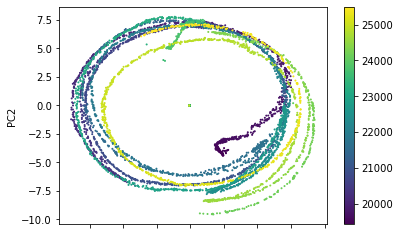

In [11]:
ax=principalDf.loc[time,:].plot.scatter(x='PC1', y='PC2', s=1, c=time, colormap='viridis')#c=principalDf.index
plt.rcParams["figure.dpi"] = 250
#principalDf.loc[0,:].plot(x='PC1', y='PC2', c='k', ax=ax, linewidth=0.0001)#c=principalDf.index

In [12]:
print(type(principalDf.loc[1,:]))
#.plot.scatter(x='PC1', y='PC2')

<class 'pandas.core.series.Series'>


# Calculate cross product of PC1 and PC2

In [4]:
path='/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220127/data/worm4/2022-01-27_21-26-53_worm4-channel-0-behaviour-/skeleton_spline_K.csv'

df=pd.read_csv(path, header=None)
df.fillna(0, inplace=True)

inital_segment, end_segment, n_components = 30, 90, 5

principalDf=make_pca(df, inital_segment, end_segment, n_components)

data shape:  (79992, 60)
(79992, 5)


In [5]:
#extract pc1 and pc2 with a given avg_win
pc1_pc2_df=extract_vectors_from_PC_df(principalDf,avg_win=16)

<AxesSubplot:>

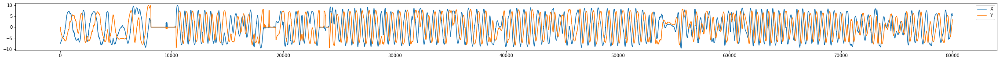

In [6]:
pc1_pc2_df.plot(figsize=(40,2))

In [17]:

#calculate cross product
cross_product_df=calculate_cross_product(pc1_pc2_df)


In [18]:
type(cross_product_df)

pandas.core.frame.DataFrame

In [19]:
cross_product_df['Cross_Product'].values

array([array(nan), array(nan), array(nan), ..., array(nan), array(nan),
       array(nan)], dtype=object)

In [15]:
cross_product_df=cross_product_df.fillna(0, inplace=True)


AttributeError: 'NoneType' object has no attribute 'fillna'

In [21]:
values = [float(value) for value in cross_product_df['Cross_Product'].values]

In [22]:
values_arr=np.array(values)

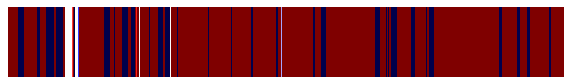

In [23]:
fig, ax =plt.subplots(figsize=(10,2))
ax.imshow(values_arr.reshape(1,-1),origin="upper",cmap='seismic', aspect=10000, vmin=-0.00005, vmax=0.00005)
ax.set_axis_off()
#plt.colorbar()

In [22]:
#simple binarization of cross product
values_arr[values_arr>0]=1
values_arr[values_arr<0]=-1

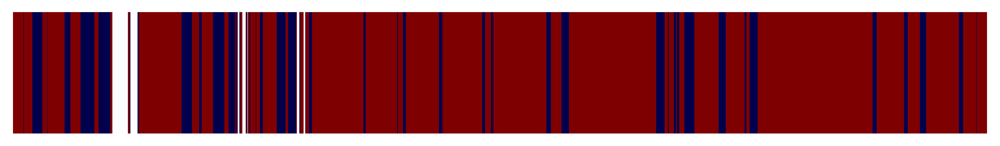

In [23]:
fig, ax =plt.subplots(figsize=(10,2),dpi=300)
ax.imshow(values_arr.reshape(1,-1),origin="upper",cmap='seismic', aspect=10000, vmin=-0.00005, vmax=0.00005)
ax.set_axis_off()

In [3]:
#cross product calculation loop
import glob

In [ ]:
files=glob.glob('/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/btf_all_binary_after_new_unet_raw_eroded_twice_29322956_3_w_validation500steps_100epochs/binary_skeleton_output/*spline_K.csv')
files=glob.glob('/groups/zimmer/Ulises/wbfm/dat/btf_binary/*spline_K.csv')

for i, file in enumerate(files):
    print(i, file)
    df=pd.read_csv(file, header=None)
    inital_segment, end_segment, n_components = 30, 60, 5
    principalDf=make_pca(df, inital_segment, end_segment, n_components)

    cross_product_df=extract_vectors_from_PC_df(principalDf,avg_win=167)
    #calculate cross product
    cross_product_df=calculate_cross_product(cross_product_df)
    cross_product_df.to_csv(os.path.splitext(file)[0]+'_cross_product.csv')

    values = [float(value) for value in cross_product_df['Cross Product'].values]

    values_arr=np.array(values)

    #simple binarization of cross product
    values_arr[values_arr>0]=1
    values_arr[values_arr<0]=-1

    fig, axes =plt.subplots(figsize=(10,2), dpi=300, )
    #for some reason some recordings rotate on the opposite direction for the PC space
    #if 3<i<9:
        #print('inverse')
        #axes.imshow(values_arr.reshape(1,-1),origin="upper",cmap='seismic', aspect=10000, vmin=-0.001, vmax=0.001)
    #else:
    axes.imshow(values_arr.reshape(1,-1),origin="upper",cmap='seismic_r', aspect=10000, vmin=-0.001, vmax=0.001)
    #axes[1].imshow(df.T,origin="upper",cmap='seismic',extent=[0,df.shape[0],df.shape[1],0],aspect=20,vmin=-0.06,vmax=0.06)

    axes.set_axis_off()
    
    plt.show()
    #fig.savefig(os.path.splitext(file)[0]+'cross_product_ethogram.png', dpi=200)

In [ ]:
#plot 3d PCA loop


In [ ]:
import glob
def plot_3d_pca(x,y,z,cross_product_array,start_frame,end_frame):
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(projection='3d')
#    only scatter plot a subsection of the timespoints
#     ax.scatter(x[start_frame:end_frame], y[start_frame:end_frame], z[start_frame:end_frame],
#                c=cross_product_array[start_frame:end_frame], s=.25, cmap='bwr')#vmin=-4e-4, vmax=4e-4, cmap='bwr')
#scatter plot everyhing
    ax.scatter(x, y, z, c=cross_product_array, s=.25, cmap='bwr')#vmin=-4e-4, vmax=4e-4, cmap='bwr')
    ax.set_xlabel('PC1', fontsize=15, labelpad=10)
    ax.set_ylabel('PC2', fontsize=15, labelpad=10)
    ax.set_zlabel('PC3', fontsize=15, labelpad=10)
    ax.tick_params(labelsize=7)


    plt.show()
    return fig, ax

In [ ]:
files=glob.glob('/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/btf_all_binary_after_new_unet_raw_eroded_twice_29322956_3_w_validation500steps_100epochs/binary_skeleton_output/*spline_K.csv')
files=glob.glob('/groups/zimmer/Ulises/wbfm/dat/btf_binary/*spline_K.csv')
for i, file in enumerate(files):
    print(i, file)
    
    df=pd.read_csv(file, header=None)
    
    inital_segment, end_segment, n_components = 1, 99, 5

    avg_win=167

    principalDf=make_pca(df, inital_segment, end_segment, n_components)

    cross_product_df=extract_vectors_from_PC_df(principalDf,avg_win=167)
    #calculate cross product
    cross_product_df=calculate_cross_product(cross_product_df)

    cross_product_array = np.array(cross_product_df['Cross Product'].rolling(window=avg_win, center=True).mean())

    x = principalDf.loc[:, 'PC1'].rolling(window=avg_win).mean()
    y = principalDf.loc[:, 'PC2'].rolling(window=avg_win).mean()
    z = principalDf.loc[:, 'PC3'].rolling(window=avg_win).mean()

    start_frame, end_frame = 250, 100000
    fig,ax=plot_3d_pca(x,y,z,cross_product_array,start_frame,end_frame)
    ax.set_axis_off()
    plt.show()
    #if i==2:break

### For loop foe every track

In [ ]:
import glob
import os

In [ ]:

path='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/btf_all_binary_after_new_unet_raw_eroded_twice_29322595_4_w_validation500steps_100epochs/binary_100_skeleton_output/'
spline_files=glob.glob(os.path.join(path,'*spline_K*.csv'))
for spline_file in spline_files:
    df=pd.read_csv(path, header=None)
    inital_segment, end_segment, n_components = 30, 90, 5
    principalDf=make_pca(df, inital_segment, end_segment, n_components)
    cross_product_df=extract_vectors_from_PC_df(principalDf,avg_win=16)
    #calculate cross product
    cross_product_df=calculate_cross_product(cross_product_df)
    values = [float(value) for value in cross_product_df['Cross Product'].values]
    values_arr=np.array(values)
    #save figure non binary
    fig, ax =plt.subplots(figsize=(10,2))
    ax.imshow(values_arr.reshape(1,-1),origin="upper",cmap='seismic', aspect=10000, vmin=-0.00005, vmax=0.00005)
    ax.set_axis_off()
    values_arr[values_arr>0]=1
    values_arr[values_arr<0]=-1
    #save figure non binary
    fig, ax =plt.subplots(figsize=(10,2))
    ax.imshow(values_arr.reshape(1,-1),origin="upper",cmap='seismic', aspect=10000, vmin=-0.00005, vmax=0.00005)
    ax.set_axis_off()

In [ ]:

#optional plotting
plt.figure(figsize=(100,5),dpi=50)
plt.plot(cross_product_df.loc[:,'Cross Product'], label='raw')
plt.plot(cross_product_df.loc[:,'Cross Product'].rolling(window=10).mean(), alpha=.5, c='r', label='mov mean')
plt.axhline(y=0, xmin=0, xmax=14000, alpha=0.2, linestyle='--', color='k')
plt.title('Cross Product')
plt.ylabel('Cross Product')
plt.xlabel('Time (frames)')
lim=0.0025#0.25

plt.ylim([-lim, lim])
plt.xlim([0, 200000])
plt.legend()

In [ ]:
#save crossporduct if needed
path='cross_product.csv'
cross_product_df.to_csv(path)

In [ ]:
plt.figure(dpi=200)
plt.scatter(x,y, c=cross_product_df.loc[:,'Cross Product'], vmin=-1e-5, vmax=1e-5, s=1, cmap='bwr')
plt.scatter(x.to_numpy()[avg_win+1],y.to_numpy()[avg_win+1], c='g', edgecolor='k')
plt.scatter(x.to_numpy()[-1],y.to_numpy()[-1], c='r', edgecolor='k')
plt.xlabel('PC1')
plt.ylabel('PC2')
#lim=0.05#0.25
#plt.xlim([-lim, lim])
#plt.ylim([-lim, lim])

### Angle Between vectors

In [ ]:

#source: https://stackoverflow.com/questions/2827393/angles-between-two-n-dimensional-vectors-in-python

import numpy as np
def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0))


In [ ]:
#create angle difference dataframe from series
frame = { 'X': x, 'Y': y } 
angle_diff_df=pd.DataFrame(data=frame)#, columns=[80, 90])#columns=['80', '90'])

ra=[np.nan]
for i, row in enumerate(angle_diff_df.iterrows()):
    if i==len(angle_diff_df)-1: continue
    r=angle_between((angle_diff_df['X'].values[i],angle_diff_df['Y'].values[i]), (angle_diff_df['X'].values[i+1],angle_diff_df['Y'].values[i+1]))
    
    ra.append(r)
angle_diff_df['Angle Diff']=ra



In [ ]:
#optional plotting
plt.plot(angle_diff_df.loc[time,'Angle Diff'], label='raw')
plt.plot(angle_diff_df.loc[time,'Angle Diff'].rolling(window=10).mean(), alpha=.5, c='r', label='mov mean')
plt.axhline(y=0, xmin=0, xmax=14000, alpha=0.2, linestyle='--')
plt.title('Angular Speed (rad)')
plt.legend()

In [ ]:
#create SIGNED angle difference dataframe from series
frame = { 'X': x, 'Y': y } 
angle_diff_sig_df=pd.DataFrame(data=frame)#, columns=[80, 90])#columns=['80', '90'])

ra=[np.nan]
for i, row in enumerate(angle_diff_sig_df.iterrows()):
    if i==len(angle_diff_sig_df)-1: continue
    r=angle_between((angle_diff_sig_df['X'].values[i],angle_diff_sig_df['Y'].values[i]), (1,0))
    
    ra.append(r)
angle_diff_sig_df['Angle Diff']=ra

In [ ]:
v1=angle_diff_sig_df['X'].values[i]
v2=angle_diff_sig_df['Y'].values[i]
print(v1)
print(v2)

In [ ]:
angle_diff_sig_df

In [ ]:
angle_diff_sig_df.loc[time,'Angle Diff'].plot()
plt.show()
ax=angle_diff_sig_df.loc[time,'Angle Diff'].diff().plot()

In [ ]:
#new_time=np.arange(26000,30000)
x1=principalDf.loc[time,'PC1'].rolling(window=avg_win).mean()
y1=principalDf.loc[time,'PC2'].rolling(window=avg_win).mean()
plt.scatter(x1,y1, c=angle_diff_sig_df.loc[time,'Angle Diff'].diff(), vmin=-0.015, vmax=0.015, s=1, cmap='spring')

In [ ]:
angle_diff_df.loc[:,'Angle Diff'].plot.hist(bins=200)
plt.xlabel('Angular Speed (rad)')

In [ ]:
cross_product_df.loc[time,'Cross Product'].plot.hist(bins=100)

In [ ]:
fig=plt.figure(dpi=200)
plt.subplot(2,1,1)
plt.plot(cross_product_df.loc[:,'Cross Product'], label='raw')
plt.plot(cross_product_df.loc[:,'Cross Product'].rolling(window=10).mean(), alpha=.5, c='r', label='mov mean')
plt.axhline(y=0, xmin=0, xmax=14000, alpha=0.2, linestyle='--', color='k')
plt.title('Cross Product')
#plt.legend()
plt.subplot(2,1,2)
plt.plot(angle_diff_df.loc[:,'Angle Diff'], label='raw')
plt.plot(angle_diff_df.loc[:,'Angle Diff'].rolling(window=10).mean(), alpha=.5, c='r', label='mov mean')
plt.axhline(y=0, xmin=0, xmax=14000, alpha=0.2, linestyle='--', color='k')
plt.title('Angular Speed')
plt.xlabel('Time (frames)')
#plt.legend()
plt.tight_layout()

### Plot Kymograph:

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob

#### plot only kymograph

In [20]:
path_after='/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm4/2022-07-29_13-06_ZIM2156_worm4_Ch0-BH/skeleton_spline_K.csv'
df_kymo_header_none=pd.read_csv(path_after, header=None)
print(df_kymo_header_none.shape)

(40032, 100)


In [21]:
df_kymo_header_none.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.029547,0.017078,0.008672,0.002668,-0.001954,-0.005775,-0.009102,-0.012060,-0.014640,-0.016735,...,-0.023558,-0.024825,-0.025440,-0.025517,-0.025271,-0.024991,-0.025051,-0.025990,-0.028786,-0.035765
1,0.046680,0.038120,0.030204,0.023044,0.016589,0.010689,0.005157,-0.000175,-0.005402,-0.010485,...,-0.025639,-0.027048,-0.027514,-0.026836,-0.024893,-0.021652,-0.017143,-0.011402,-0.004423,0.003843
2,-0.061894,-0.023739,-0.003150,0.007808,0.013163,0.014712,0.013427,0.010026,0.005106,-0.000843,...,-0.024168,-0.026597,-0.028425,-0.029245,-0.028643,-0.026343,-0.022344,-0.016962,-0.010761,-0.004421
3,-0.050411,-0.023698,-0.005661,0.005103,0.010587,0.012198,0.010981,0.007773,0.003217,-0.002230,...,-0.024643,-0.026502,-0.027254,-0.026656,-0.024641,-0.021317,-0.016881,-0.011499,-0.005198,0.002202
4,-0.045144,-0.017933,-0.003410,0.004205,0.007725,0.008468,0.007125,0.004142,-0.000127,-0.005338,...,-0.023301,-0.025888,-0.027833,-0.028889,-0.028900,-0.027854,-0.025880,-0.023189,-0.020003,-0.016475


In [25]:
features = np.arange(30, 80) 

In [31]:
data = df_kymo_header_none.loc[:, features].values

In [32]:
data

array([[ 0.01702258,  0.01294567,  0.00819724, ...,  0.01749949,
         0.01424835,  0.01089509],
       [ 0.00608903,  0.00245779, -0.0009269 , ...,  0.01633958,
         0.01252899,  0.00881877],
       [ 0.0109396 ,  0.00683406,  0.00311094, ...,  0.0173739 ,
         0.01309904,  0.00913318],
       ...,
       [-0.01480327, -0.01607863, -0.01707627, ..., -0.01109988,
        -0.01464859, -0.01865008],
       [-0.01421933, -0.01557154, -0.01667494, ..., -0.01010476,
        -0.01348343, -0.01729705],
       [-0.01387997, -0.01534899, -0.0165846 , ..., -0.0099077 ,
        -0.01330842, -0.01716293]])

In [27]:
data

array([[ 0.01702258,  0.01294567,  0.00819724, ...,  0.01749949,
         0.01424835,  0.01089509],
       [ 0.00608903,  0.00245779, -0.0009269 , ...,  0.01633958,
         0.01252899,  0.00881877],
       [ 0.0109396 ,  0.00683406,  0.00311094, ...,  0.0173739 ,
         0.01309904,  0.00913318],
       ...,
       [-0.01480327, -0.01607863, -0.01707627, ..., -0.01109988,
        -0.01464859, -0.01865008],
       [-0.01421933, -0.01557154, -0.01667494, ..., -0.01010476,
        -0.01348343, -0.01729705],
       [-0.01387997, -0.01534899, -0.0165846 , ..., -0.0099077 ,
        -0.01330842, -0.01716293]])

In [22]:
df_kymo=pd.read_csv(path_after)
print(df_kymo.shape)

(40031, 100)


In [23]:
df_kymo.head()

,0.02954748859417845,0.017078108383761732,0.008672489388347282,0.0026680466843729237,-0.0019538626663724835,-0.0057749106952925434,-0.009102189676600753,-0.012060105962306005,-0.014640092481647621,-0.016735180922411837,...,-0.023557504216551485,-0.024825106154463074,-0.025439695624873263,-0.025517372588140363,-0.02527081955994463,-0.02499067511789049,-0.025051044314455956,-0.025989930628322548,-0.028785655963996813,-0.035765090200462785
0,0.046680,0.038120,0.030204,0.023044,0.016589,0.010689,0.005157,-0.000175,-0.005402,-0.010485,...,-0.025639,-0.027048,-0.027514,-0.026836,-0.024893,-0.021652,-0.017143,-0.011402,-0.004423,0.003843
1,-0.061894,-0.023739,-0.003150,0.007808,0.013163,0.014712,0.013427,0.010026,0.005106,-0.000843,...,-0.024168,-0.026597,-0.028425,-0.029245,-0.028643,-0.026343,-0.022344,-0.016962,-0.010761,-0.004421
2,-0.050411,-0.023698,-0.005661,0.005103,0.010587,0.012198,0.010981,0.007773,0.003217,-0.002230,...,-0.024643,-0.026502,-0.027254,-0.026656,-0.024641,-0.021317,-0.016881,-0.011499,-0.005198,0.002202
3,-0.045144,-0.017933,-0.003410,0.004205,0.007725,0.008468,0.007125,0.004142,-0.000127,-0.005338,...,-0.023301,-0.025888,-0.027833,-0.028889,-0.028900,-0.027854,-0.025880,-0.023189,-0.020003,-0.016475
4,-0.056551,-0.031486,-0.013567,-0.002507,0.003541,0.005962,0.005669,0.003310,-0.000612,-0.005662,...,-0.025150,-0.025936,-0.025761,-0.024679,-0.022836,-0.020403,-0.017495,-0.014079,-0.009839,-0.003861


In [30]:
data = df_kymo.loc[:, features].values

KeyError: "None of [Int64Index([30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46,\n            47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63,\n            64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79],\n           dtype='int64')] are in the [columns]"

In [29]:
data

array([[ 0.00608903,  0.00245779, -0.0009269 , ...,  0.01633958,
         0.01252899,  0.00881877],
       [ 0.0109396 ,  0.00683406,  0.00311094, ...,  0.0173739 ,
         0.01309904,  0.00913318],
       [ 0.00984427,  0.00601983,  0.00256943, ...,  0.01538447,
         0.01124784,  0.00758983],
       ...,
       [-0.01480327, -0.01607863, -0.01707627, ..., -0.01109988,
        -0.01464859, -0.01865008],
       [-0.01421933, -0.01557154, -0.01667494, ..., -0.01010476,
        -0.01348343, -0.01729705],
       [-0.01387997, -0.01534899, -0.0165846 , ..., -0.0099077 ,
        -0.01330842, -0.01716293]])

In [7]:
folders=['skeleton_after_new_unet','skeleton_after_head_and_tail_from_unet_test']
idx=1
path_after='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/'+folders[idx]+'/2020-07-01_18-36-25_control_worm6_spline_K.csv'
print(path_after)
df_kymo=pd.read_csv(path_after, header=None)
print(df_kymo.shape)

/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/skeleton_after_head_and_tail_from_unet_test/2020-07-01_18-36-25_control_worm6_spline_K.csv


FileNotFoundError: [Errno 2] No such file or directory: '/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/skeleton_after_head_and_tail_from_unet_test/2020-07-01_18-36-25_control_worm6_spline_K.csv'

In [5]:
path_after='/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm4/2022-07-29_13-06_ZIM2156_worm4_Ch0-BH/skeleton_spline_K.csv'
df_kymo=pd.read_csv(path_after, header=None)
print(df_kymo.shape)

(40032, 100)


In [ ]:
fig, axes=plt.subplots(dpi=400, figsize=(40,4),)
axes.imshow(df_kymo.T,origin="upper",cmap='seismic',extent=[0,df_kymo.shape[0],df_kymo.shape[1],0],aspect=20,vmin=-0.06,vmax=0.06)


In [ ]:
#plot multiple kymos
(See curvature/scripts)


In [2]:
import glob

In [ ]:
spline_paths=glob.glob('/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm*/*_Ch0-BH/skeleton_spline_K.csv')

for kymo_path in spline_paths:
    df_kymo=pd.read_csv(kymo_path, header=None)
    print(df_kymo.shape)
    fig, axes=plt.subplots(dpi=400, figsize=(40,4),)
    fig.suptitle(kymo_path)
    axes.imshow(df_kymo.T,origin="upper",cmap='seismic',extent=[0,df_kymo.shape[0],df_kymo.shape[1],0],aspect=20,vmin=-0.06,vmax=0.06)


In [11]:
# Read and plot beh_annotation

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob

In [5]:
import sys

In [6]:
3#to be able to have rel imports.
#path_root = Path(__file__).parents[2]
sys.path.append(str('/Volumes/scratch/neurobiology/zimmer/ulises/code/curvature/'))
print(sys.path)

['/Volumes/scratch/neurobiology/zimmer/ulises/code/curvature/curvature/dev', '/Users/ulises.rey/opt/anaconda3/envs/openCV_local/lib/python38.zip', '/Users/ulises.rey/opt/anaconda3/envs/openCV_local/lib/python3.8', '/Users/ulises.rey/opt/anaconda3/envs/openCV_local/lib/python3.8/lib-dynload', '', '/Users/ulises.rey/opt/anaconda3/envs/openCV_local/lib/python3.8/site-packages', '/Users/ulises.rey/local_code/moving_worms/moving_worms-pkg', '/Volumes/scratch/neurobiology/zimmer/ulises/code/curvature/']


In [9]:
from curvature.src.annotate_behaviour import *

In [10]:
#fetch folders
main_path='/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/'

beh_paths=glob.glob(os.path.join(main_path,'*worm*/*BH*'))
print(beh_paths)

['/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm12/2022-07-29_18-08_ZIM2156_worm12_Ch0-BH', '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm1/2022-07-29_11-34_ZIM2156_worm1_Ch0-BH', '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm3/2022-07-29_12-25_ZIM2156_worm3good_Ch0-BH', '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm4/2022-07-29_13-06_ZIM2156_worm4_Ch0-BH', '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm6/2022-07-29_15-25_ZIM2156_worm6_Ch0-BH', '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm11/2022-07-29_17-55_ZIM2156_worm11_Ch0-BH', '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm2/2022-07-29_12-02_ZIM2156_worm2_Ch0-BH', '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729

/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm12/2022-07-29_18-08_ZIM2156_worm12_Ch0-BH


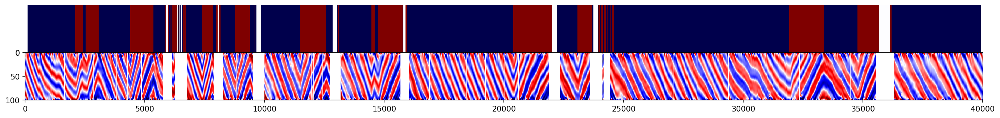

/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm1/2022-07-29_11-34_ZIM2156_worm1_Ch0-BH


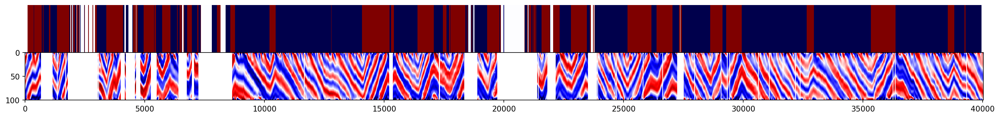

/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm3/2022-07-29_12-25_ZIM2156_worm3good_Ch0-BH


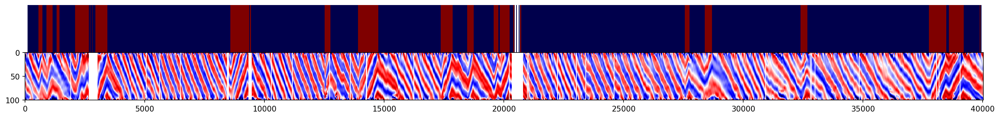

/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm4/2022-07-29_13-06_ZIM2156_worm4_Ch0-BH


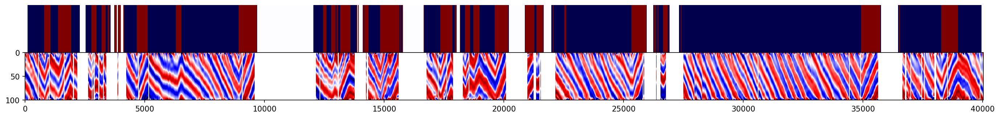

/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm6/2022-07-29_15-25_ZIM2156_worm6_Ch0-BH


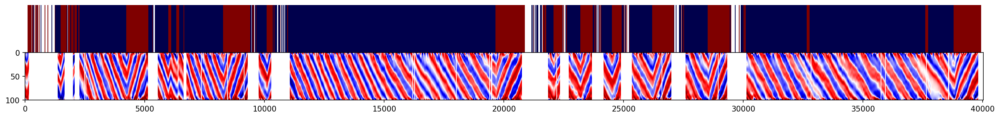

/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm11/2022-07-29_17-55_ZIM2156_worm11_Ch0-BH


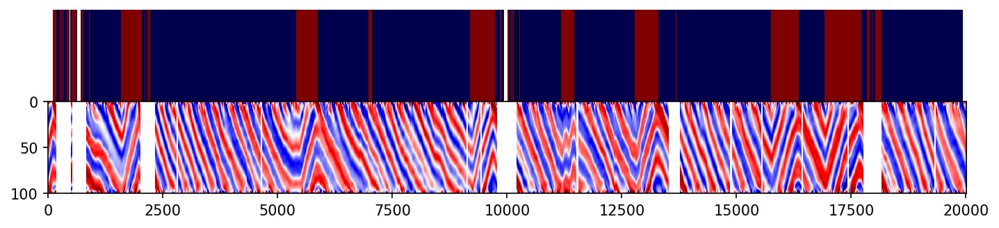

/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm2/2022-07-29_12-02_ZIM2156_worm2_Ch0-BH


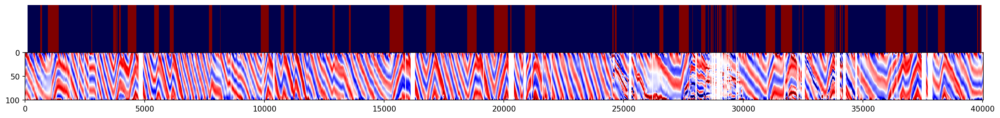

/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm5/2022-07-29_14-59_ZIM2156_worm5_Ch0-BH


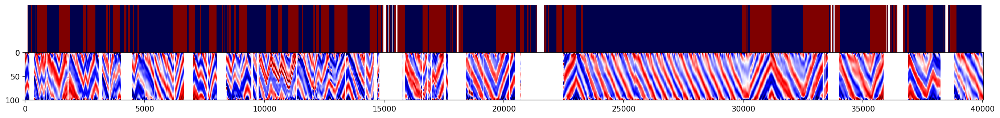

In [11]:

for project in beh_paths:
    print(project)
    #if '2022-01-27_19-31-00_worm1' in project: 
    kymo_path=os.path.join(project, 'skeleton_spline_K.csv')
    df_kymo=pd.read_csv(kymo_path, header=None)

    beh_annotation_path = os.path.join(project, 'beh_annotation.csv')
    beh_annotation_df = pd.read_csv(beh_annotation_path, index_col=0, header=None)
    # beh_annotation_df= beh_annotation_df*-1
    # beh_annotation_df.to_csv(os.path.join(project, 'beh_annotation.csv'))
    fig = ethogram_figure(df_kymo, beh_annotation_df)
    fig.set_size_inches(400, 2)
    plt.show()
    #fig.suptitle(os.path.basename(project))


<AxesSubplot:xlabel='0'>

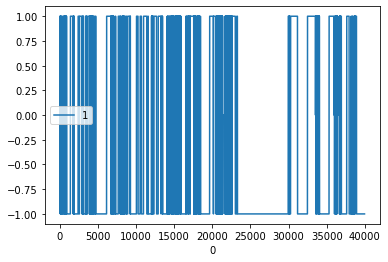

In [9]:
beh_annotation_df.plot()

In [33]:
## Merge all the Spline K files into one to do PCA

In [26]:
#fets spline_K csv files
main_path='/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/'

beh_paths=glob.glob(os.path.join(main_path,'*worm*/*BH*/*spline_K*.csv'))

In [27]:
beh_paths

['/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm12/2022-07-29_18-08_ZIM2156_worm12_Ch0-BH/skeleton_spline_K.csv',
 '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm1/2022-07-29_11-34_ZIM2156_worm1_Ch0-BH/skeleton_spline_K.csv',
 '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm3/2022-07-29_12-25_ZIM2156_worm3good_Ch0-BH/skeleton_spline_K.csv',
 '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm4/2022-07-29_13-06_ZIM2156_worm4_Ch0-BH/skeleton_spline_K.csv',
 '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm6/2022-07-29_15-25_ZIM2156_worm6_Ch0-BH/skeleton_spline_K.csv',
 '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20220729_12ms/data/ZIM2156_worm11/2022-07-29_17-55_ZIM2156_worm11_Ch0-BH/skeleton_spline_K.csv',
 '/Volumes/scratch/neurobiology/zimmer/ulises/wbfm/20220729/20

In [28]:
res=concatenate_dataframes(beh_paths)

In [29]:
res

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.030841,0.031313,0.029112,0.024806,0.019307,0.013418,0.007612,0.002059,-0.003264,-0.008457,...,0.014924,0.011559,0.008837,0.006651,0.004901,0.003509,0.002414,0.001580,0.000992,0.000653
1,0.011719,0.018950,0.025137,0.029378,0.030860,0.029391,0.025559,0.020377,0.014770,0.009319,...,0.024168,0.018370,0.013102,0.008296,0.003669,-0.001248,-0.007194,-0.015399,-0.027985,-0.048244
2,-0.038371,-0.014854,0.003005,0.015605,0.023276,0.026093,0.024658,0.020278,0.014418,0.008128,...,0.017672,0.012047,0.006960,0.001963,-0.003670,-0.011182,-0.022925,-0.043498,-0.079881,-0.127628
3,0.006925,0.014500,0.020625,0.024355,0.025135,0.023152,0.019221,0.014320,0.009203,0.004275,...,0.021536,0.016082,0.011519,0.007727,0.004504,0.001619,-0.001178,-0.004187,-0.007828,-0.012798
4,0.023359,0.030317,0.034603,0.034453,0.030074,0.023271,0.015963,0.009289,0.003614,-0.001134,...,0.021881,0.018448,0.014404,0.009828,0.004593,-0.001882,-0.011098,-0.026590,-0.056189,-0.109600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40027,-0.105026,-0.055475,-0.033801,-0.023531,-0.018244,-0.015369,-0.013768,-0.012876,-0.012380,-0.012085,...,0.010089,0.013013,0.016682,0.021369,0.027398,0.035059,0.044368,0.054568,0.063515,0.067843
40028,-0.026590,-0.023587,-0.020909,-0.018614,-0.016695,-0.015113,-0.013820,-0.012769,-0.011916,-0.011224,...,0.013865,0.019249,0.025367,0.031368,0.035440,0.035124,0.028524,0.015330,-0.003550,-0.026529
40029,-0.056485,-0.038661,-0.028767,-0.023006,-0.019482,-0.017224,-0.015702,-0.014611,-0.013763,-0.013041,...,0.009082,0.012522,0.016919,0.022608,0.029915,0.038943,0.049103,0.058505,0.063980,0.062838
40030,-0.107225,-0.054663,-0.032213,-0.021868,-0.016677,-0.013936,-0.012477,-0.011727,-0.011367,-0.011188,...,0.012879,0.017006,0.021817,0.027103,0.032272,0.036267,0.037780,0.035793,0.030078,0.021087


In [40]:
res.to_csv('/Users/ulises.rey/local_data/PCA_analysis/res_2.csv')

In [ ]:
#Visualize Kymogram of concatenated kymos


In [59]:
path_after='/Users/ulises.rey/local_data/PCA_analysis/skeleton_spline_K.csv'
df_kymo=pd.read_csv(path_after, header=None)

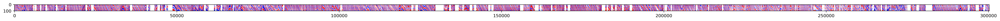

In [60]:
fig, axes=plt.subplots(dpi=400, figsize=(40,4),)

axes.imshow(df_kymo.T,origin="upper",cmap='seismic',extent=[0,df_kymo.shape[0],df_kymo.shape[1],0],aspect=20,vmin=-0.06,vmax=0.06)

In [102]:
beh_annotation_path='/Users/ulises.rey/local_data/PCA_analysis/beh_annotation.csv'
#importnat, header=0!!
beh_annotation_df=pd.read_csv(beh_annotation_path, index_col=0, header=0)

In [103]:
beh_annotation_df.shape

(300216, 1)

In [104]:
beh_annotation_df.head(200)

,0
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
195,-1.0
196,-1.0
197,-1.0
198,-1.0


In [105]:
df_kymo.shape

(300217, 101)

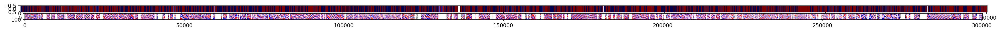

In [106]:
fig = plt.figure(dpi=150, figsize=(100,0.5))#, dpi=200
ax1 = fig.add_subplot(2, 1, 1)

ax1.imshow(beh_annotation_df.values.T, origin="upper",cmap='seismic',  vmin=-0.00005, vmax=0.00005, aspect=20*100) #
ax2 = fig.add_subplot(2, 1, (2))
ax2.imshow(df_kymo.T, origin="upper", cmap='seismic', extent=[0, df_kymo.shape[0], df_kymo.shape[1], 0], vmin=-0.06, vmax=0.06, aspect=20)


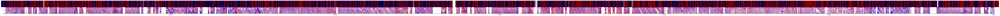

In [107]:
fig = ethogram_figure(df_kymo, beh_annotation_df)
fig.set_size_inches(400, 2)
plt.show()

In [98]:
principal_components='/Users/ulises.rey/local_data/PCA_analysis/principal_components.csv'
#importnat, header=0!!
principal_components_df=pd.read_csv(principal_components)

In [97]:
principal_components_df.shape

(300217, 6)

<AxesSubplot:>

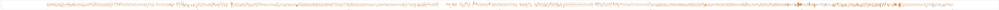

In [112]:
principal_components_df['PC1'].plot(figsize=(500,5))
principal_components_df['PC2'].plot(figsize=(500,5))

In [ ]:
#nd of concatenating part

In [100]:
beh_annotation_df.head(100)

,0
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
95,-1.0
96,-1.0
97,-1.0
98,-1.0


In [39]:
# Manuel ERC Grant (One Kymograph)

In [ ]:
path_after='/Users/ulises.rey/local_data/skeleton/2021-03-04_16-17-30_worm3_spline_K.csv'
df_kymo=pd.read_csv(path_after, header=None)
print(df_kymo.shape)

In [ ]:
df_kymo=df_kymo.loc[0:3000,:]

In [ ]:
df_kymo = df_kymo.fillna(method='ffill')

In [ ]:
#This part was for Manuel's ERC interview
df_kymo=df_kymo.rolling(axis=0, window=6, win_type='gaussian', center=True, min_periods=1).mean(std=2)
df_kymo=df_kymo.rolling(axis=1, window=2, win_type='gaussian', center=True, min_periods=1).mean(std=1)

#print(df_kymo.shape)

In [ ]:
fig, axes=plt.subplots(dpi=150, figsize=(60,4),)
axes.imshow(df_kymo.T,origin="upper",cmap='seismic',extent=[0,df_kymo.shape[0],df_kymo.shape[1],0],aspect=20/10,vmin=-0.06,vmax=0.06)
axes.set_ylabel('Body Segment')
axes.set_xlabel('Time (s)')
axes.set_xticks(np.arange(0, df_kymo.shape[0], 100), np.arange(0, 301, 10))
extensions=['png', 'pdf', 'eps']
for extension in extensions:
    print('extension is:' ,extension)
    plt.savefig('kymogram_worm3.'+extension, dpi=100, format=extension)

In [ ]:
#Compare two kymograms

In [ ]:
folders=['binary_100_skeleton_output','binary_150_skeleton_output']#['skeleton_after_new_unet','skeleton_after_head_and_tail_from_unet_test']
for folder in folders:
    path_after='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/btf_all_binary_after_new_unet_raw_eroded_twice_29322595_4_w_validation500steps_100epochs/'+folder+'/2020-07-01_18-36-25_control_worm6-_spline_K.csv'
    print(path_after)
    df_kymo=pd.read_csv(path_after, header=None)
    print(df_kymo.shape)
    fig, axes=plt.subplots(dpi=400, figsize=(60,2),)
    axes.imshow(df_kymo.T,origin="upper",cmap='seismic',extent=[0,df_kymo.shape[0],df_kymo.shape[1],0],aspect=20,vmin=-0.06,vmax=0.06)


In [ ]:
path_after='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/skeleton_after_head_and_tail_from_unet_all_long_job/2020-07-01_13-21-00_chemotaxisl_worm1-_spline_K.csv'

df_kymo=pd.read_csv(path_after, header=None)
print(df_kymo.shape)

In [ ]:
df_kymo=df_kymo.loc[23000:29000,:]
print(df_kymo.shape)

In [ ]:
fig, axes=plt.subplots(dpi=400, figsize=(60,4),)
axes.imshow(df_kymo.T,origin="upper",cmap='seismic',extent=[0,df_kymo.shape[0],df_kymo.shape[1],0],aspect=20,vmin=-0.06,vmax=0.06)


In [ ]:
path='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/skeleton_after_head_and_tail_from_unet/2020-07-01_18-36-25_control_worm6_new_wrapper_spline_K.csv'

df_kymo=pd.read_csv(path, header=None)
print(df_kymo.shape)
fig, axes=plt.subplots(dpi=400, figsize=(60,2),)
axes.imshow(df_kymo.T,origin="upper",cmap='seismic',extent=[0,df_kymo.shape[0],df_kymo.shape[1],0],aspect=20,vmin=-0.06,vmax=0.06)

In [ ]:
path='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/btf_all_binary_after_unet_25493234/skeleton_output/2020-07-01_18-36-25_control_worm6-_spline_K.csv' #2020-07-01_18-36-25_control_worm6_new_wrapper_spline_K.csv'

df_kymo=pd.read_csv(path, header=None)
print(df_kymo.shape)
fig, axes=plt.subplots(dpi=400, figsize=(60,2),)
axes.imshow(df_kymo.T,origin="upper",cmap='seismic',extent=[0,df_kymo.shape[0],df_kymo.shape[1],0],aspect=20,vmin=-0.06,vmax=0.06)

In [ ]:
## Plot multiple Kymographs


In [ ]:
import glob

In [ ]:
main_path='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/btf_all_binary_after_new_unet_raw_eroded_twice_29322956_3_w_validation500steps_100epochs/binary_skeleton_output/'

files=glob.glob(os.path.join(main_path,'*spline_K*'))
print('there are', len(files), 'files.')

for kymo_path in files:
    print(kymo_path)
    print(os.path.splitext(kymo_path))
    
    df_kymo=pd.read_csv(kymo_path, header=None)
    print(df_kymo.shape)
    fig, axes=plt.subplots(dpi=400, figsize=(60,2),)
    axes.imshow(df_kymo.T,origin="upper",cmap='seismic',extent=[0,df_kymo.shape[0],df_kymo.shape[1],0],aspect=20,vmin=-0.06,vmax=0.06)
    #plt.show()
    fig.savefig(os.path.splitext(kymo_path)[0]+'_kymo.png')#), dpi=100, facecolor='w', edgecolor='w', orientation='portrait', papertype=None, format=None, transparent=False, bbox_inches=None, pad_inches=0.1,frameon=None, metadata=None)

In [ ]:
## Compare multiple Kymographs

In [ ]:


before_folder='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/btf_all_binary_after_new_unet_raw_eroded_twice_29322956_3_w_validation500steps_100epochs/binary_skeleton_output/'#'skeleton_after_new_unet'
after_folder='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/btf_all_binary_after_new_unet_raw_eroded_twice_29322956_3_w_validation500steps_100epochs/binary_skeleton_output_updated/'

files=glob.glob(os.path.join(before_folder,'*spline_K*'))
print('there are', len(files), 'files.')

for i,filename in enumerate(files):
    
    before_kymo_path=os.path.join(before_folder,filename)
    after_kymo_path=os.path.join(after_folder,filename)
    
    df_before_kymo=pd.read_csv(before_kymo_path, header=None)
    print('before size: ', df_before_kymo.shape)
    df_after_kymo=pd.read_csv(after_kymo_path, header=None)
    print('after size: ', df_after_kymo.shape)
    #print(df_kymo.shape)
    fig, axes=plt.subplots(nrows=2,dpi=400, figsize=(60,2),sharex=True)
    
    axes[0].imshow(df_before_kymo.T,origin="upper",cmap='seismic',extent=[0,df_before_kymo.shape[0],df_before_kymo.shape[1],0],aspect=20,vmin=-0.06,vmax=0.06)
    axes[1].imshow(df_after_kymo.T,origin="upper",cmap='seismic',extent=[0,df_after_kymo.shape[0],df_after_kymo.shape[1],0],aspect=20,vmin=-0.06,vmax=0.06)

    plt.show()
    #break

In [ ]:
#ERC Manuel

In [ ]:
import glob
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [ ]:


main_path='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/skeleton_after_head_and_tail_from_unet_all/'

files=glob.glob(os.path.join(main_path,'*2020-07-01_13-21-00_chemotaxisl_worm1*spline_K*'))
print('there are', len(files), 'files.')

for kymo_path in files:
    print(kymo_path)
    df_kymo=pd.read_csv(kymo_path, header=None)
    print(df_kymo.shape)
    fig, axes=plt.subplots(dpi=400, figsize=(60,2),)
    axes.imshow(df_kymo.T,origin="upper",cmap='seismic',extent=[0,df_kymo.shape[0],df_kymo.shape[1],0],aspect=20,vmin=-0.06,vmax=0.06)
    plt.show()

In [ ]:
import matplotlib
font = {'family' : 'Sans Serif',
        'weight' : 'normal',
        'size'   : 6}

matplotlib.rc('font', **font)

In [ ]:
%matplotlib inline

In [ ]:
t0=93100+25000/2#0
tf=115000-1000#500
print(t0,tf)

In [ ]:
#plt.figure(figsize=(60,4))
t0=105600#109000#105600#0
tf=114000#112000#114000#500
time=np.arange(t0,tf)#np.arange(93100,115000)#np.arange(93100,110000)

segments=np.arange(0,90)
new_df_kymo=df_kymo.iloc[time,segments]#140000


print(new_df_kymo.shape[0])
print(new_df_kymo.shape[1])
extent=[0,new_df_kymo.shape[0]/167,new_df_kymo.shape[1],0]#[0,new_df_kymo.shape[0]/167,new_df_kymo.shape[1],0]
print('extent is: ',extent)
fig, axes=plt.subplots(dpi=300, figsize=(5,5))

axes.imshow(new_df_kymo.T,origin="upper",cmap='seismic',extent=extent,aspect=0.1,vmin=-0.06,vmax=0.06)

#set xticks
#axes.set_xticks(np.arange(t0,tf,20))
# axes.set_xticklabels(labels=np.arange(0,101,10),fontdict=font)

axes.set_yticks(np.linspace(0,90,10))

#labels
axes.set_xlabel('Time (s)')
axes.set_ylabel('Body Segment')

#save
# extensions=['png', 'pdf', 'eps']
# for extension in extensions:
#     print('extension is:' ,extension)
#     plt.savefig('kymogram_93100_115000.'+extension, dpi=150, format=extension)

In [ ]:
new_df_kymo

In [ ]:
new_df_kymo.shape

In [ ]:
plt.plot(new_df_kymo.loc[105600,:])
plt.hlines(0, 0, 90, colors='k', linestyles='dotted', label='', data=None, alpha=.2)


In [ ]:
pwd

In [ ]:
#plt.figure(figsize=(60,4))
fig, axes=plt.subplots(figsize=(60,2), ncols=1, nrows=2, sharex=True)
axes[0].imshow(df_kymo.T,origin="upper",cmap='seismic',extent=[0,df_kymo.shape[0],df_kymo.shape[1],0],aspect=28,vmin=-0.05,vmax=0.05)
axes[1].plot(cross_product_df.loc[:,'Cross Product'].rolling(window=20).mean(), alpha=.5, c='r', label='mov mean', linewidth=0.1)
axes[1].axhline(y=0, xmin=0, xmax=200000, alpha=0.2, linestyle='--', color='k')
lim=0.001
axes[1].set_ylim([-lim,lim])

In [ ]:

fig,axes=plt.subplots(dpi=200, ncols=1, nrows=2)
axes[0].plot(cross_product_df.loc[:,'Cross Product'], label='raw')
axes[0].plot(cross_product_df.loc[:,'Cross Product'].rolling(window=10).mean(), alpha=.5, c='r', label='mov mean')
axes[0].axhline(y=0, alpha=0.2, linestyle='--')
axes[0].set_title('Cross Product')
axes[1].imshow(df_kymo.T,origin="upper",cmap='seismic',extent=[0,df_kymo.shape[0],df_kymo.shape[1],0],aspect=20,vmin=-0.05,vmax=0.05)


In [ ]:
y.values[150]

In [ ]:
avg_principalDf=pd.DataFrame()
avg_win=150
avg_principalDf=principalDf.rolling(window=avg_win).mean()
x='PC1'
y='PC2'
t_range=np.arange(12000)#(20000,30000)#np.arange(18000,22000)
plt.rcParams["figure.dpi"] = 140
avg_principalDf.loc[t_range,:].plot.scatter(x=x, y=y, c=t_range, colormap='viridis')#c=principalDf.index
#ax.set_xlabel('PC1')
#ax.show()
#ax.set_ylabel("y label")

In [ ]:
plt.rcParams["figure.dpi"] = 250
ax=principalDf.loc[t_range,:].plot.scatter(x=x, y=y, c=t_range, colormap='viridis')#c=principalDf.index
avg_principalDf.loc[t_range,:].plot.scatter(x=x, y=y, c='k', ax=ax, linewidth=0.0001)#c=principalDf.index

In [ ]:
##Animations
from IPython.display import clear_output

#time=np.arange(18000,42000)#np.arange(10000,14000)
avg_win=75
x=principalDf.loc[:,'PC1'].rolling(window=avg_win).mean()
y=principalDf.loc[:,'PC2'].rolling(window=avg_win).mean()

for t in time:
    #print(t)
    
    if t<avg_win: continue
    if t%20!=0: continue
    #print(time[0])
    #print(t)    
    fig=plt.figure(dpi=100)
    
    #with cross product color
    plt.scatter(x[time[0]:t+200],y[time[0]:t+200], c=-1*cross_product_df.loc[time[0]:t+199,'Cross Product'], vmin=-1e-5, vmax=1e-5, s=1, cmap='bwr', alpha=0.1)
    plt.scatter(x[t:t+200],y[t:t+200], c=-1*cross_product_df.loc[t:t+199,'Cross Product'], vmin=-1e-5, vmax=1e-5, s=1, cmap='bwr')
    #without
    #plt.scatter(x[time[0]:t+200],y[time[0]:t+200], s=1, cmap='viridis', alpha=0.1)
    #plt.scatter(x[t:t+200],y[t:t+200], s=1, cmap='viridis')
    
    plt.scatter(x[t+200],y[t+200], s=10, c='k')

    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.xlim([-0.25, 0.25])
    plt.ylim([-0.25, 0.25])
    plt.colorbar()
    plt.show()
    fig.savefig('pc_plot_good/PC_'+str(t)+'.png')
    plt.close(fig)
    clear_output(wait=True)
    if t>12000: break


In [ ]:
#With Worm image (does not work yet)
from IPython.display import clear_output

##Animations
#time=np.arange(18000,42000)#np.arange(10000,14000)
avg_win=150
x=principalDf.loc[:,'PC1'].rolling(window=avg_win).mean()
y=principalDf.loc[:,'PC2'].rolling(window=avg_win).mean()

fig, f_axs = plt.subplots(ncols=2, nrows=1, constrained_layout=False, figsize=(10,5), dpi=100)

#     f_axs[i].plot(eigenworm)
#     f_axs[i].set_title('Eigenworm ' +str(i+1))

for t in time:
    #print(t)
    
    if t<avg_win: continue
    if t%25!=0: continue
    #print(time[0])
    #print(t)    
    
    #with cross product color
    
    f_axs[0].scatter(x[time[0]:t+200],y[time[0]:t+200], c=cross_product_df.loc[time[0]:t+199,'Cross Product'], vmin=-1e-5, vmax=1e-5, s=1, cmap='bwr', alpha=0.1)
    f_axs[0].scatter(x[t:t+200],y[t:t+200], c=cross_product_df.loc[t:t+199,'Cross Product'], vmin=-1e-5, vmax=1e-5, s=1, cmap='bwr')
    #without
    #plt.scatter(x[time[0]:t+200],y[time[0]:t+200], s=1, cmap='viridis', alpha=0.1)
    #plt.scatter(x[t:t+200],y[t:t+200], s=1, cmap='viridis')
    
    f_axs[0].scatter(x[t+200],y[t+200], s=10, c='k')

    f_axs[0].set_xlabel('PC1')
    f_axs[0].set_ylabel('PC2')
    f_axs[0].set_xlim([-0.25, 0.25])
    f_axs[0].set_ylim([-0.25, 0.25])
    #f_axs[0].colorbar()
    
    
    #worm image
    f_axs[1].imshow(img)
    
    plt.show()
    fig.savefig('pca_plot/PCA_'+str(t)+'.png')
    plt.close(fig)
    clear_output(wait=True)
    if t>18360: break


## Plot Eigenworms

In [ ]:
fig1, f1_axs = plt.subplots(ncols=10, nrows=1, constrained_layout=False, figsize=(20,2), dpi=100)
for i, eigenworm in enumerate(pca.components_):
    f1_axs[i].plot(eigenworm)
    f1_axs[i].set_title('Eigenworm ' +str(i+1))
#     f1_axs[0,i].set_xlabel('Time (frames)')
#     f1_axs[0,i].set_ylabel('Signal Amplitude (a.u)')
#         fig.plot(eigenworm)
#     .title('Eingenworm ' +str(i))
#     plt.show()
# i=i+1
# f1_axs[i].plot(pca.explained_variance_ratio_.cumsum())
# f1_axs[i].plot(pca.explained_variance_ratio_.cumsum(), 'bo')
# f1_axs[i].ylim([0,1])
# f1_axs[i].ylabel('Variance Explained')
# f1_axs[i].xlabel('PC')
# f1_axs[i].xticks(np.arange(5), principalDf.columns)

### Variance explained

In [ ]:
fig=plt.figure(dpi=100)
plt.plot(pca.explained_variance_ratio_.cumsum())
plt.plot(pca.explained_variance_ratio_.cumsum(), 'bo')
plt.ylim([0,1])
plt.ylabel('Variance Explained')
plt.xlabel('PC')
plt.xticks(np.arange(10), principalDf.columns)
print(pca.explained_variance_ratio_)

## Worm reconstruction
After: https://stats.stackexchange.com/questions/229092/how-to-reverse-pca-and-reconstruct-original-variables-from-several-principal-com

In [ ]:
# import numpy as np
# import sklearn.datasets, sklearn.decomposition

# X = sklearn.datasets.load_iris().data
mu = np.mean(data, axis=0)

# pca = sklearn.decomposition.PCA()
# pca.fit(X)
print('data shape is:'+ str(data.shape))

nComp = 2
Xhat = np.dot(pca.transform(data)[:,:nComp], pca.components_[:nComp,:])
Xhat += mu

print(Xhat.shape)

print(Xhat[timepoint,])
plt.plot(Xhat[timepoint,])
plt.xlabel('Body Segment')
plt.show()

In [ ]:
print(principalComponents.shape)
data_projected=pca.inverse_transform(principalComponents)
print(data_projected.shape)
timepoint=100
plt.plot(data[timepoint], 'k',label='data')
plt.plot(data_projected[timepoint], 'r', label='sine')
plt.show()

In [ ]:
plt.plot(principalComponents[timepoint], 'bo')
plt.plot(principalComponents[timepoint], 'b')
plt.show()

In [ ]:
import scipy.integrate as integrate

ot=[-0.09665224,-0.07036113,-0.03568482,-0.01095966,0.00456963,0.01301288
,0.01515584,0.01173461,0.00414439,-0.00591745,-0.01690003,-0.02733173
,-0.03561634,-0.04040833,-0.04201307,-0.04197229,-0.04145336,-0.04097342
,-0.04039757,-0.03901989,-0.03604182,-0.03138896,-0.02541762,-0.01855388
,-0.01105998,-0.0030018,0.0055531,0.01420982,0.02225497,0.02885308
,0.03348408,0.03643765,0.03896626,0.04252434,0.04779851,0.05435349
,0.0601166,0.06159833,0.05643516,0.04708227,0.03764399,0.03031391
,0.02566415,0.02374812,0.02468111,0.02810224,0.0329226,0.03739168
,0.03942093,0.03787015,0.03350831,0.02821021,0.02336129,0.01953443
,0.01680448,0.0150475,0.01410302,0.01383596,0.01414799,0.01496608
,0.01621833,0.01779798,0.01951598,0.02109437,0.02230348,0.02294774
,0.02289075,0.02209662,0.02064323,0.01870233,0.0164995,0.01427403
,0.01225227,0.0106369,0.00960616,0.00929413,0.00959219,0.01024835
,0.01100999,0.01164035,0.01193764,0.01175322,0.01100029,0.00964567
,0.00768182,0.00508159,0.00173786,-0.00261436,-0.0083581,-0.01599204
,-0.02626018,-0.0397085,-0.05526394,-0.0679705,-0.06914133,-0.05546475
,-0.03580964,-0.01800506,-0.00173962,0.02144568]

#conver to array
ot=np.array(ot)
print(ot.shape)
#reshape
ot=ot.reshape(1, -1)
print(ot.shape)
print(ot)
plt.plot(ot[0,:])
plt.title('Omega Centerline')

print(ot_pc.shape)
#plt.plot(pca.inverse_transform(pca.fit_transform(omega_centerline_k)))

In [ ]:
ot_pc=pca.transform(ot)

In [ ]:
ot_pc_inv=pca.inverse_transform(ot_pc)
print(ot_pc_inv.shape)
plt.plot(ot[0,:])
plt.plot(ot_pc_inv[0,:])
plt.show()

# For body segments

In [ ]:
#path='/groups/zimmer/Ulises/code/skeleton_OLD/spline/second_der_np_new.csv'
path='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/all_good_skeleton/2020-07-01_10-10-48_control_worm1_spline_K.csv'
# has no reversals path='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/all_good_skeleton/2020-06-30_18-17-47_chemotaxis_worm5_spline_K.csv'
df=pd.read_csv(path, header=None)

print(df.shape)
df.dropna(inplace=True)
print(df.shape)


plt.rcParams["figure.dpi"] = 100

In [ ]:
time=np.arange(10000,14000)#np.arange(30000,34000)
avg_win=1
x=df.loc[time,80].rolling(window=avg_win).mean()
y=df.loc[time,90].rolling(window=avg_win).mean()
# x.dropna(inplace=True)
# y.dropna(inplace=True)
plt.scatter(x,y, c=np.arange(len(x)), s=1, cmap='viridis')
plt.scatter(x.to_numpy()[avg_win+1],y.to_numpy()[avg_win+1], c='g')
plt.scatter(x.to_numpy()[-1],y.to_numpy()[-1], c='r')
plt.colorbar()

In [ ]:
#create dataframe from series
frame = { 'X': x, 'Y': y } 
cross_product_df=pd.DataFrame(data=frame)#, columns=[80, 90])#columns=['80', '90'])

ra=[np.nan]
for i, row in enumerate(cross_product_df.iterrows()):
    if i==len(cross_product_df)-1: continue
    r=np.cross([cross_product_df['X'].values[i],cross_product_df['Y'].values[i]], [cross_product_df['X'].values[i+1],cross_product_df['Y'].values[i+1]])
    
    ra.append(r)
cross_product_df['Cross Product']=ra

#optional plotting
plt.plot(cross_product_df.loc[:,'Cross Product'], label='raw')
plt.plot(cross_product_df.index, cross_product_df.loc[:,'Cross Product'].rolling(window=10).mean(), alpha=.5, c='r', label='mov mean')
plt.axhline(y=0, xmin=0, xmax=14000, alpha=0.2, linestyle='--')
plt.title('Cross Product')
plt.legend()

In [ ]:
plt.scatter(x,y, c=cross_product_df.loc[:,'Cross Product'], vmin=-1e-5, vmax=1e-5, s=1, cmap='bwr')
plt.scatter(x.to_numpy()[0],y.to_numpy()[0], c='g')
plt.scatter(x.to_numpy()[-1],y.to_numpy()[-1], c='r')

In [ ]:
plt.scatter(x,y, c=cross_product_df.loc[:,'Cross Product'], vmin=-1e-5, vmax=1e-5, s=1, cmap='bwr')
plt.scatter(x.to_numpy()[0],y.to_numpy()[0], c='g')
plt.scatter(x.to_numpy()[-1],y.to_numpy()[-1], c='r')

In [ ]:
plt.plot(x, label='80')
plt.plot(y, label='90')
plt.legend()

## Plot track

In [ ]:
plt.rcParams["figure.dpi"] = 300
lag=-150#-250
ax=track_df.plot.scatter(x='x', y='y', s=0.1, c=-1*cross_product_df.loc[time+lag,'Cross Product'], cmap='bwr')
ax.plot(track_df['x'].head(1),track_df['y'].head(1), 'go', markersize=10)
ax.plot(track_df['x'].tail(1),track_df['y'].tail(1), 'ro', markersize=10)
# ax.set_ylim([19.5,21.5])
# ax.set_xlim([15,17.5])

In [ ]:
filename='/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/all_tracks/2020-07-01_10-10-48_control_worm1-TablePosRecord.txt'
track_df=pd.read_csv(filename)
track_df.rolling(window=10).mean()
track_df=track_df.loc[time,:]
ax=track_df.plot(x='x', y='y', linewidth=5, figsize=(20,20))
plt.plot(track_df['x'].head(1),track_df['y'].head(1), 'go', markersize=15)
plt.plot(track_df['x'].tail(1),track_df['y'].tail(1), 'ro', markersize=15)



In [ ]:
cross_product_df.loc[time]

## Fictive Data

In [ ]:
#vector
x = np.array([[2,1], [-1,3], [-2,-2]])
y = np.array([[-1,3], [2,2], [2,2]])
np.cross(x, y)

In [ ]:
#coords
x = np.array([[0,0], [2,1], [1,4],[-1,-2]])
y = np.array([[2,1], [1,4], [-1,-2],[2,3]])
np.cross(x, y)

In [ ]:
np.dot(x, y)

In [ ]:
x = np.array([2,-1])
y = np.array([-1,3])
np.cross(x, y)

In [ ]:
x = np.array([-1,3])
y = np.array([2,2])
np.cross(x, y)

In [ ]:
x = np.array([2,2])
y = np.array([-2,-2])
np.cross(x, y)

In [ ]:
x = np.array([2,2])
y = np.array([-3,-3])
np.cross(x, y)

In [ ]:
x = np.array([[0,0], [2,1], [2,2]])
y = np.array([[2,1], [2,2], [-2,-2]])
np.cross(x, y)

## 3D plots

In [ ]:
#3D plottingdiffport matplotlib.pyplot as plt
import numpy as np

# Fixing random state for reproducibility
np.random.seed(19680801)


def randrange(n, vmin, vmax):
    '''
    Helper function to make an array of random numbers having shape (n, )
    with each number distributed Uniform(vmin, vmax).
    '''
    return (vmax - vmin)*np.random.rand(n) + vmin

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

n = 100

# For each set of style and range settings, plot n random points in the box
# defined by x in [23, 32], y in [0, 100], z in [zlow, zhigh].
for m, zlow, zhigh in [('o', -50, -25), ('^', -30, -5)]:
    xs = randrange(n, 23, 32)
    ys = randrange(n, 0, 100)
    zs = randrange(n, zlow, zhigh)
    ax.scatter(xs, ys, zs, marker=m)

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()

In [ ]:

# Import pandas as pd
import pandas as pd

# Read in the CSV file: df
df=principalDf

# Import figure from bokeh.plotting
from bokeh.plotting import figure
from bokeh.io import push_notebook, show, output_notebook 

# Create the figure: p
p = figure(x_axis_label='PC2', y_axis_label='PC3')

# Plot mpg vs hp by color
p.circle(df['PC2'], df['PC3'], size=10)

# Specify the name of the output file and show the result
output_notebook()
show(p)

In [ ]:
plt.figure(figsize=(14,7))
plt.plot(principalDf['PC1'][3000:4000])
plt.plot(principalDf['PC2'][3000:4000])

In [ ]:
pca.explained_variance_ratio_

In [ ]:
fig = principalDf.plot.scatter(x='PC1', y='PC2',c=principalDf.index, colormap='viridis')
fig= principalDf.plot(x='PC1', y='PC2')
fig.set_xlim([-1,1])
fig.set_ylim([-1,1])

In [ ]:
plt.figure(figsize=(7,7))
for k,d in principalDf:
    plt.scatter(k,d)
#plt.scatter(principalDf['PC1'][0:10],principalDf['PC2'][0:10])
#plt.plot(principalDf['PC2'][3000:4000])

In [ ]:
k,d=principalDf

In [ ]:
d

In [ ]:
plt.scatter(principalDf['PC1'][0:4000],principalDf['PC2'][0:4000],c=np.arange(0,4000), vmin=0, vmax=4000)
plt.colorbar()
# ax_lim=0.2
# plt.xlim(-ax_lim,ax_lim)
# plt.ylim(-ax_lim,ax_lim)

In [ ]:
plt.figure(figsize=(14,10))
plt.hist2d(principalDf['PC1'],principalDf['PC2'], bins=1000)
plt.colorbar()
ax_lim=.2
plt.xlim(-ax_lim,ax_lim)
plt.ylim(-ax_lim,ax_lim)

In [ ]:
plt.scatter(principalDf['PC1'],principalDf['PC3'],marker='.')
plt.xlim(-.5,.5)
plt.ylim(-.5,.5)

In [ ]:
plt.scatter(principalDf['PC1'],principalDf['PC4'],marker='.')
plt.xlim(-.5,.5)
plt.ylim(-.5,.5)

In [ ]:
import re
dir=re.split('-channel',re.split('/',input_filename)[-1])[0]

In [ ]:
dir+'_skeleton_X_coords.csv'

In [ ]:
plt.figure(figsize=(14,10))
plt.hist2d(principalDf['PC1'],principalDf['PC2'], bins=1000)
plt.colorbar()
ax_lim=.2
plt.xlim(-ax_lim,ax_lim)
plt.ylim(-ax_lim,ax_lim)

In [ ]:
plt.scatter(principalDf['PC1'],principalDf['PC3'],marker='.')
plt.xlim(-.5,.5)
plt.ylim(-.5,.5)

In [ ]:
plt.scatter(principalDf['PC1'],principalDf['PC4'],marker='.')
plt.xlim(-.5,.5)
plt.ylim(-.5,.5)

# PCA for DLC-centerline output

In [ ]:
#I CANT DO THIS UNTIL I CALCULATE THE K from the CEnterlines of the centerlines obtained from DLC
import pandas as pd
import glob

In [ ]:
path=glob.glob('/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/avi_all/*2020-07-01_18-36-25*34000*h5')
df=pd.read_hdf(path[0], header=None)

df.shape
df.dropna(inplace=True) #Drop NaNs, required otherwise pca.fit_transform(x) does not run
df.fillna(0, inplace=True) #alternative change nans to zeros
features = np.arange(30,95)# Separating out the features (starting bodypart, ending bodypart)
data = df.loc[:, features].values
print(data.shape)

#PCA
pca = PCA(n_components=5)
principalComponents = pca.fit_transform(data)
print(principalComponents.shape)
principalDf = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2', 'PC3','PC4','PC5'])# 'PC6', 'PC7', 'PC8','PC9','PC10'])

In [ ]:
path=glob.glob('/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/avi_all/*2020-07-01_18-36-25*34000*h5')


In [ ]:
path=glob.glob('/groups/zimmer/Ulises/wbfm/chemotaxis_assay/2020_Only_behaviour/avi_all/*2020-07-01_18-36-25*34000*h5')
df=pd.read_hdf(path[0], header=None)

In [ ]:
df.values

In [1]:
import tifffile as tiff

In [ ]:
tiff.imwrite()